In [117]:
!pip install matplotlib numpy scikit-learn cv2 sklearn transformers scikit-image

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [118]:
import os
import shutil
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from PIL import Image
import numpy as np
import seaborn as sns
import pandas as pd
from PIL import Image
import cv2
import albumentations as A
from PIL import Image


In [119]:
def create_split_datasets(source_dir, base_output_dir):
    """
    Split dataset into train, validation and test sets (80:10:10)
    and organize them in respective directories
    """
    # Get all class folders
    class_folders = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]
    
    # Create main directories
    splits = ['train', 'val', 'test']
    for split in splits:
        split_dir = os.path.join(base_output_dir, split)
        if not os.path.exists(split_dir):
            os.makedirs(split_dir)
            
        # Create class subdirectories
        for class_name in class_folders:
            class_dir = os.path.join(split_dir, class_name)
            if not os.path.exists(class_dir):
                os.makedirs(class_dir)

    # Split and copy files for each class
    for class_name in class_folders:
        # Get all images in the class
        class_path = os.path.join(source_dir, class_name)
        images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        
        # First split: 80% train, 20% remaining
        train_imgs, temp_imgs = train_test_split(images, train_size=0.8, random_state=42)
        
        # Second split: Split remaining 20% into validation and test (10% each of total)
        val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=42)
        
        # Copy files to respective directories
        for img in train_imgs:
            src = os.path.join(class_path, img)
            dst = os.path.join(base_output_dir, 'train', class_name, img)
            shutil.copy2(src, dst)
            
        for img in val_imgs:
            src = os.path.join(class_path, img)
            dst = os.path.join(base_output_dir, 'val', class_name, img)
            shutil.copy2(src, dst)
            
        for img in test_imgs:
            src = os.path.join(class_path, img)
            dst = os.path.join(base_output_dir, 'test', class_name, img)
            shutil.copy2(src, dst)

def plot_random_images(source_dir, num_images=10):
    """
    Plot random images from the dataset
    """
    # Get all image paths
    image_paths = []
    class_folders = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]
    
    for class_name in class_folders:
        class_path = os.path.join(source_dir, class_name)
        images = [os.path.join(class_path, f) for f in os.listdir(class_path) 
                 if f.endswith(('.jpg', '.jpeg', '.png'))]
        image_paths.extend(images)
    
    # Randomly sample images
    selected_images = random.sample(image_paths, min(num_images, len(image_paths)))
    
    # Create subplot grid
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.ravel()
    
    for idx, img_path in enumerate(selected_images):
        img = Image.open(img_path)
        class_name = os.path.basename(os.path.dirname(img_path))
        axes[idx].imshow(img)
        axes[idx].axis('off')
        axes[idx].set_title(f'Class: {class_name}')
    
    plt.tight_layout()
    plt.show()

In [120]:
def analyze_class_distribution(dataset_path):
    """
    Analyze and plot class distribution in the dataset
    Returns a dictionary with class frequencies
    """
    # Get class frequencies
    class_distribution = {}
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            n_samples = len([f for f in os.listdir(class_path) 
                           if f.endswith(('.jpg', '.jpeg', '.png'))])
            class_distribution[class_name] = n_samples
    
    return class_distribution

def plot_class_distribution(class_distribution):
    """
    Create bar plot of class distribution
    """
    # Convert to DataFrame for easier plotting
    df = pd.DataFrame(list(class_distribution.items()), 
                     columns=['Class', 'Frequency'])
    
    # Sort by frequency for better visualization
    df = df.sort_values('Frequency', ascending=False)
    
    # Create figure with appropriate size
    plt.figure(figsize=(15, 8))
    
    # Create bar plot
    sns.barplot(data=df, x='Class', y='Frequency')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Add labels and title
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution in Dataset')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Show the plot
    plt.show()
    
    # Print statistics
    print("\nClass Distribution Statistics:")
    print(f"Total number of classes: {len(class_distribution)}")
    print(f"Maximum class size: {df['Frequency'].max()} ({df.iloc[0]['Class']})")
    print(f"Minimum class size: {df['Frequency'].min()} ({df.iloc[-1]['Class']})")
    print(f"Mean class size: {df['Frequency'].mean():.2f}")
    print(f"Median class size: {df['Frequency'].median()}")
    
    # Calculate imbalance ratio
    imbalance_ratio = df['Frequency'].max() / df['Frequency'].min()
    print(f"Imbalance ratio (max/min): {imbalance_ratio:.2f}")

def write_imbalance_solutions():
    """
    Write markdown text describing solutions for class imbalance
    """
    solutions = """
# Techniques to Handle Class Imbalance

## 1. Data-level Solutions

### Oversampling Techniques
- **Random Oversampling**: Randomly duplicate samples from minority classes
- **SMOTE (Synthetic Minority Over-sampling Technique)**: Create synthetic samples for minority classes
- **ADASYN (Adaptive Synthetic Sampling)**: Generate synthetic data for minority classes with focus on difficult-to-learn samples

### Undersampling Techniques
- **Random Undersampling**: Randomly remove samples from majority classes
- **Tomek Links**: Remove majority class samples that form Tomek links
- **Near Miss**: Select samples from majority class based on their distance to minority class

### Hybrid Methods
- **SMOTEENN**: Combine SMOTE with Edited Nearest Neighbors
- **SMOTETomek**: Combine SMOTE with Tomek links removal

## 2. Algorithm-level Solutions

### Cost-sensitive Learning
- Assign higher costs to misclassification of minority classes
- Use weighted loss functions during training

### Ensemble Methods
- **Balanced Bagging**: Use balanced bootstrap samples
- **Balanced Random Forest**: Use balanced bootstrap samples in random forest
- **Easy Ensemble**: Train multiple classifiers on balanced subsets
- **RUSBoost**: Combine random undersampling with boosting

## 3. Deep Learning Specific Solutions

### Data Augmentation
- Apply transformations like rotation, flipping, scaling
- Use mixup or CutMix augmentation
- Implement style transfer for generating new samples

### Architecture Modifications
- Use class-balanced loss functions
- Implement focal loss to focus on hard examples
- Use two-phase training with different sampling strategies

### Training Strategies
- Use class weights in loss function
- Implement curriculum learning
- Use different learning rates for different classes

## 4. Evaluation Considerations

- Use appropriate metrics (F1-score, AUROC, precision-recall curves)
- Implement stratified k-fold cross-validation
- Consider macro-averaging metrics instead of micro-averaging

## Implementation Steps:

1. First, analyze the extent of imbalance using the visualization
2. Choose appropriate technique(s) based on:
   - Dataset size and characteristics
   - Available computational resources
   - Model requirements
3. Implement selected techniques
4. Validate using appropriate metrics
5. Iterate and combine methods if necessary
"""
    return solutions


In [121]:
def load_and_preprocess_image(image_path):
    """
    Load and preprocess image, ensuring RGB format
    """
    # Load image using PIL
    img = Image.open(image_path)
    
    # Convert to RGB if not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    
    # Convert to numpy array
    img_array = np.array(img)
    
    # Normalize if needed (ensure values are between 0 and 1)
    if img_array.max() > 1.0:
        img_array = img_array / 255.0
        
    return img_array

def plot_rgb_histograms_combined(images, image_paths, fig_size=(20, 25)):
    """
    Plot original images with their RGB histograms using multiple visualization methods
    """
    for idx, (image, img_path) in enumerate(zip(images, image_paths)):
        class_name = os.path.basename(os.path.dirname(img_path))
        
        # Create figure with subplots
        fig = plt.figure(figsize=(15, 10))
        
        # Original Image subplot
        plt.subplot(2, 2, 1)
        plt.imshow(image)
        plt.title(f'Original Image\nClass: {class_name}')
        plt.axis('off')
        
        # Extract color channels
        red, green, blue = image[:,:,0], image[:,:,1], image[:,:,2]
        red_pixels = red.flatten()
        green_pixels = green.flatten()
        blue_pixels = blue.flatten()
        
        # Method 1: Overlaid Histograms
        plt.subplot(2, 2, 2)
        plt.hist(red_pixels, bins=256, density=False, color='red', alpha=0.5, label='Red')
        plt.hist(green_pixels, bins=256, density=False, color='green', alpha=0.4, label='Green')
        plt.hist(blue_pixels, bins=256, density=False, color='blue', alpha=0.3, label='Blue')
        plt.title('RGB Channels - Overlaid Histograms')
        plt.xlabel('Intensity')
        plt.ylabel('Pixel Count')
        plt.legend()
        
        # Method 2: Line Plot using np.histogram
        plt.subplot(2, 2, 3)
        for pixels, color, label in zip([red_pixels, green_pixels, blue_pixels], 
                                      ['red', 'green', 'blue'],
                                      ['Red', 'Green', 'Blue']):
            hist_values, bin_edges = np.histogram(pixels, bins=256, range=(0, 1))
            plt.plot(bin_edges[:-1], hist_values, color=color, alpha=0.7, label=label)
        plt.yscale('log')  # Log scale for better visualization
        plt.title('RGB Channels - Distribution (Log Scale)')
        plt.xlabel('Intensity')
        plt.ylabel('Pixel Count (Log)')
        plt.legend()
        
        # Method 3: Channel Statistics
        plt.subplot(2, 2, 4)
        channel_stats = {
            'Red': {'mean': np.mean(red_pixels), 'std': np.std(red_pixels)},
            'Green': {'mean': np.mean(green_pixels), 'std': np.std(green_pixels)},
            'Blue': {'mean': np.mean(blue_pixels), 'std': np.std(blue_pixels)}
        }
        
        # Create text for statistics
        stats_text = "Channel Statistics:\n\n"
        for channel, stats in channel_stats.items():
            stats_text += f"{channel}:\n"
            stats_text += f"Mean: {stats['mean']:.3f}\n"
            stats_text += f"Std: {stats['std']:.3f}\n\n"
        
        plt.text(0.1, 0.1, stats_text, fontsize=10, family='monospace')
        plt.axis('off')
        plt.title('Channel Statistics')
        
        plt.tight_layout()
        plt.show()
        
        # Print additional information
        print(f"\nImage Analysis - {class_name}")
        print("Shape:", image.shape)
        print("Intensity Range:", image.min(), "to", image.max())

def analyze_random_train_images(train_dir, num_images=5):
    """
    Select and analyze random images from training directory
    """
    # Get all image paths
    image_paths = []
    for root, _, files in os.walk(train_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(root, file))
    
    # Randomly select images
    selected_paths = random.sample(image_paths, min(num_images, len(image_paths)))
    
    # Load and analyze images
    images = [load_and_preprocess_image(path) for path in selected_paths]
    
    # Plot histograms
    plot_rgb_histograms_combined(images, selected_paths)


In [122]:
def load_random_images(train_dir, num_images=5):
    """
    Load random images from training directory
    
    Args:
        train_dir: Path to training directory
        num_images: Number of images to select
    
    Returns:
        list: List of image file paths (strings)
    """
    image_paths = []
    for root, _, files in os.walk(train_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(root, file))
    
    # Ensure we don't try to sample more images than available
    num_to_select = min(num_images, len(image_paths))
    selected_paths = random.sample(image_paths, num_to_select)
    
    return selected_paths  # Return list of strings, not tuples

def load_and_convert_image(image_path):
    """
    Load image and convert to RGB if needed
    
    Args:
        image_path: Path to the image file
    
    Returns:
        numpy.ndarray: RGB image array
    """
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Failed to load image: {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def apply_augmentations(image):
    """
    Apply three different geometric augmentations to an image
    
    Args:
        image: Input image array
    
    Returns:
        tuple: (rotated_img, flipped_img, resized_img)
    """
    height, width = image.shape[:2]
    
    # 1. Rotation (30 degrees)
    rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 30, 1.0)
    rotated_img = cv2.warpAffine(image, rotation_matrix, (width, height))
    
    # 2. Horizontal Flip
    flipped_img = cv2.flip(image, 1)
    
    # 3. Random Crop and Resize
    scale = 0.8
    new_height = int(height * scale)
    new_width = int(width * scale)
    start_y = random.randint(0, height - new_height)
    start_x = random.randint(0, width - new_width)
    
    cropped_img = image[start_y:start_y+new_height, start_x:start_x+new_width]
    resized_img = cv2.resize(cropped_img, (width, height))
    
    return rotated_img, flipped_img, resized_img

def plot_augmentations(original_img, aug1_img, aug2_img, aug3_img, class_name, image_number):
    """
    Plot original and augmented images
    
    Args:
        original_img: Original image array
        aug1_img, aug2_img, aug3_img: Augmented image arrays
        class_name: Name of the image class
        image_number: Index of the current image
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    images = [original_img, aug1_img, aug2_img, aug3_img]
    titles = ['Original', 'Rotation (30°)', 'Horizontal Flip', 'Random Crop & Resize']
    
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(f'{title}\n{class_name}')
        ax.axis('off')
    
    plt.suptitle(f'Image {image_number} Augmentations', y=1.05)
    plt.tight_layout()
    plt.show()
    
    print(f"\nAugmentation Details for Image {image_number}:")
    print(f"Class: {class_name}")
    print("1. Rotation: 30 degrees clockwise")
    print("2. Horizontal Flip: Mirror image along vertical axis")
    print("3. Random Crop: 80% of original size, then resized back")
    print(f"Original Image Shape: {original_img.shape}")

def apply_sequential_augmentations(train_dir, num_images=5):
    """
    Apply augmentations to random images and display results
    
    Args:
        train_dir: Path to training directory
        num_images: Number of images to process
    """
    try:
        # Get random image paths
        image_paths = load_random_images(train_dir, num_images)
        
        # Process each image
        for idx, img_path in enumerate(image_paths, 1):
            try:
                # Get class name from path
                class_name = os.path.basename(os.path.dirname(img_path))
                
                print(f"\nProcessing Image {idx} from class: {class_name}")
                
                # Load and process image
                original_img = load_and_convert_image(img_path)
                rotated_img, flipped_img, cropped_resized_img = apply_augmentations(original_img)
                
                # Plot results
                plot_augmentations(
                    original_img, 
                    rotated_img, 
                    flipped_img, 
                    cropped_resized_img,
                    class_name, 
                    idx
                )
            except Exception as e:
                print(f"Error processing image {img_path}: {str(e)}")
                continue
                
    except Exception as e:
        print(f"Error in sequential augmentation process: {str(e)}")


In [123]:
def apply_sequential_color_augmentations(train_directory):
    """
    Apply 10 different color/pixel-level augmentations sequentially to 5 randomly selected images
    
    Args:
        train_directory (str): Path to training dataset directory containing image folders
    """
    # Get list of all image files recursively
    image_files = []
    for root, _, files in os.walk(train_directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))
    
    # Validate image count
    if not image_files:
        raise ValueError(f"No images found in directory: {train_directory}")
    
    # Select random images (up to 5)
    num_images = min(5, len(image_files))
    selected_images = random.sample(image_files, num_images)
    
    # Define 10 different color augmentations
    augmentations = [
        ("Original", None),  # No augmentation for original
        ("Brightness+Contrast", A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1)),
        ("Color Jitter", A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1)),
        ("Gaussian Blur", A.GaussianBlur(blur_limit=(3, 7), p=1)),
        ("CLAHE", A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1)),
        ("Channel Shuffle", A.ChannelShuffle(p=1)),
        ("RGB Shift", A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=1)),
        ("Random Gamma", A.RandomGamma(gamma_limit=(80, 120), p=1)),
        ("Sharpen", A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1)),
        ("Emboss", A.Emboss(alpha=(0.2, 0.5), strength=(0.2, 0.7), p=1)),
        ("Random Shadow", A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), p=1))
    ]
    
    # Create figure
    n_cols = len(augmentations)
    fig = plt.figure(figsize=(20, 4*num_images))
    fig.suptitle('Sequential Color and Pixel-level Augmentations', fontsize=16, y=0.95)
    
    # Process each selected image
    for img_idx, img_path in enumerate(selected_images):
        try:
            # Read image
            image = cv2.imread(img_path)
            if image is None:
                raise ValueError(f"Failed to read image: {img_path}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            # Get class name from path
            class_name = os.path.basename(os.path.dirname(img_path))
            
            # Apply each augmentation sequentially
            for aug_idx, (aug_name, aug_transform) in enumerate(augmentations):
                plt.subplot(num_images, n_cols, img_idx * n_cols + aug_idx + 1)
                
                if aug_transform is None:
                    # Display original image
                    plt.imshow(image)
                    title = f'{aug_name}\nClass: {class_name}'
                else:
                    # Apply and display augmentation
                    transform = A.Compose([aug_transform])
                    augmented = transform(image=image)['image']
                    plt.imshow(augmented)
                    title = aug_name
                
                plt.title(title, fontsize=10)
                plt.axis('off')
                
        except Exception as e:
            print(f"Error processing image {img_path}: {str(e)}")
            continue
    
    plt.tight_layout()
    plt.show()


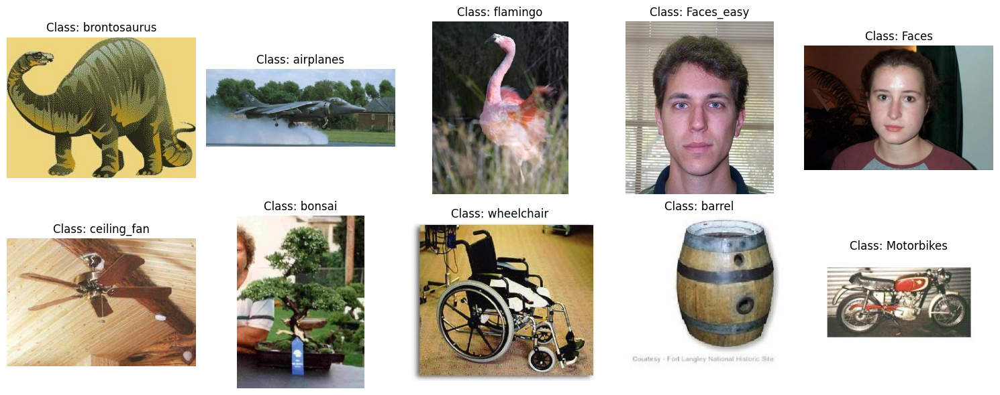

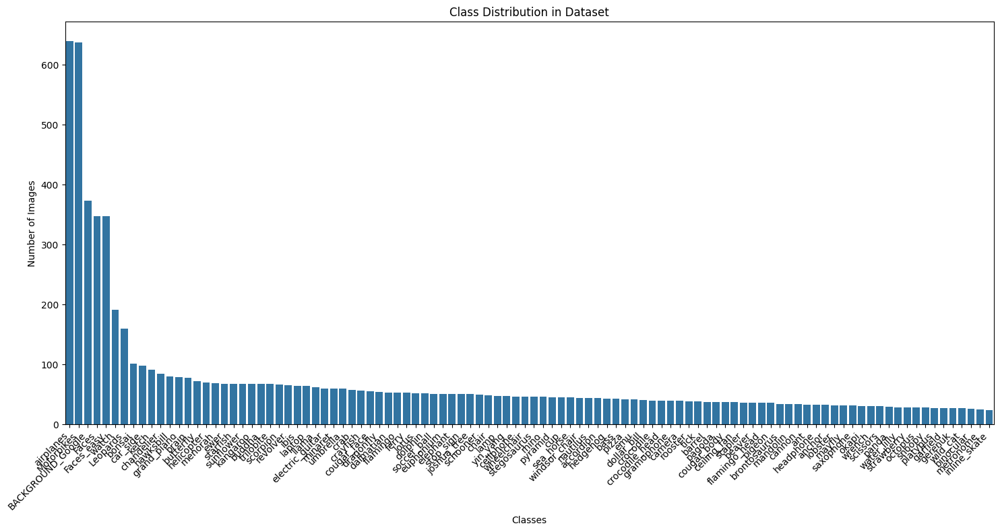


Class Distribution Statistics:
Total number of classes: 102
Maximum class size: 640 (airplanes)
Minimum class size: 24 (inline_skate)
Mean class size: 71.37
Median class size: 47.0
Imbalance ratio (max/min): 26.67

# Techniques to Handle Class Imbalance

## 1. Data-level Solutions

### Oversampling Techniques
- **Random Oversampling**: Randomly duplicate samples from minority classes
- **SMOTE (Synthetic Minority Over-sampling Technique)**: Create synthetic samples for minority classes
- **ADASYN (Adaptive Synthetic Sampling)**: Generate synthetic data for minority classes with focus on difficult-to-learn samples

### Undersampling Techniques
- **Random Undersampling**: Randomly remove samples from majority classes
- **Tomek Links**: Remove majority class samples that form Tomek links
- **Near Miss**: Select samples from majority class based on their distance to minority class

### Hybrid Methods
- **SMOTEENN**: Combine SMOTE with Edited Nearest Neighbors
- **SMOTETomek**: Combine SMO

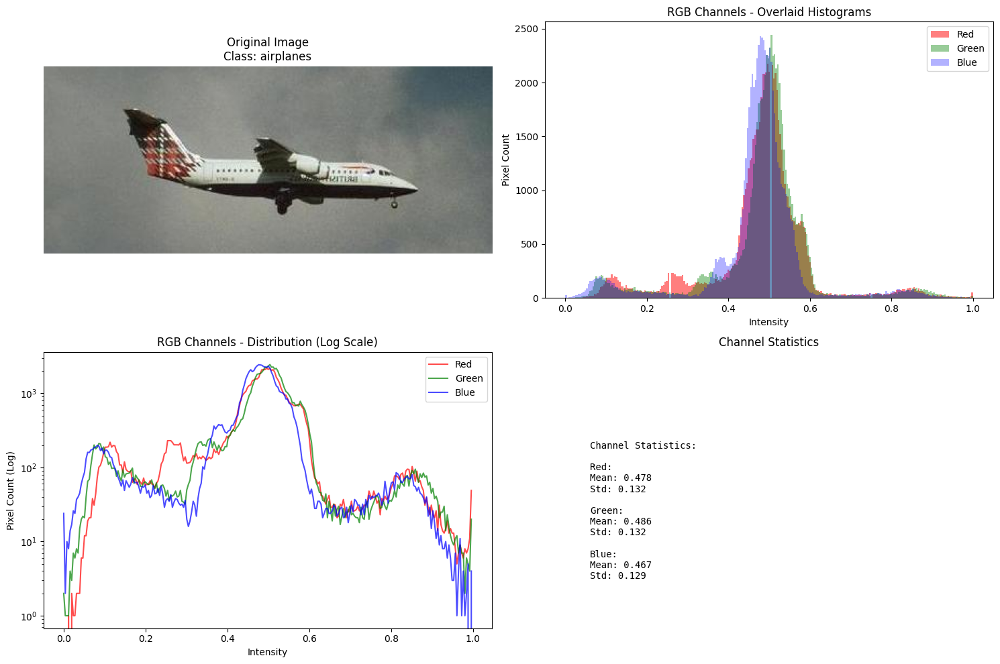


Image Analysis - airplanes
Shape: (174, 416, 3)
Intensity Range: 0.0 to 1.0


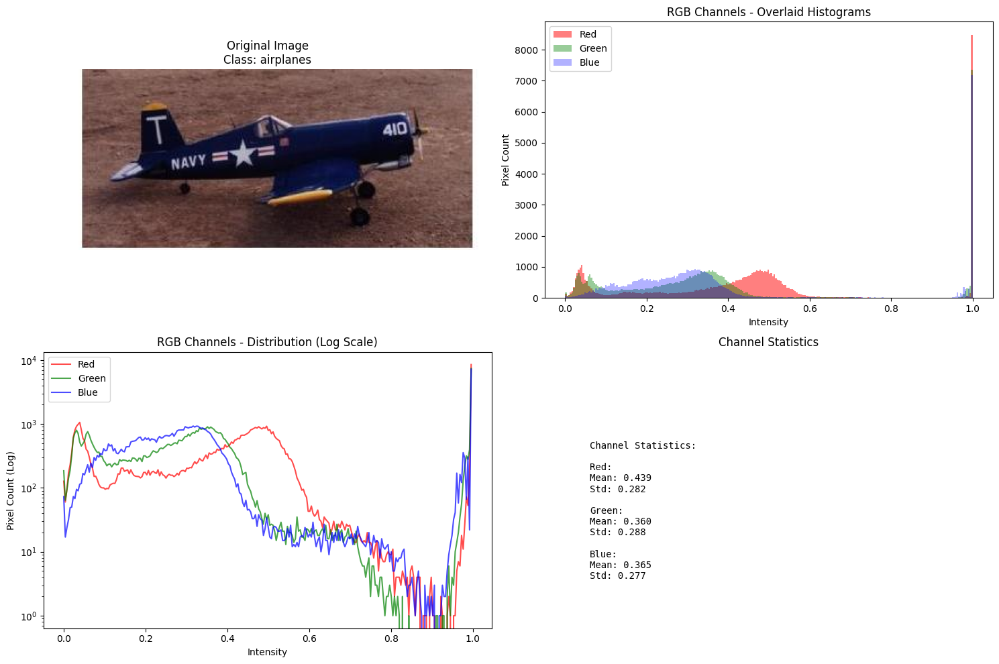


Image Analysis - airplanes
Shape: (160, 396, 3)
Intensity Range: 0.0 to 1.0


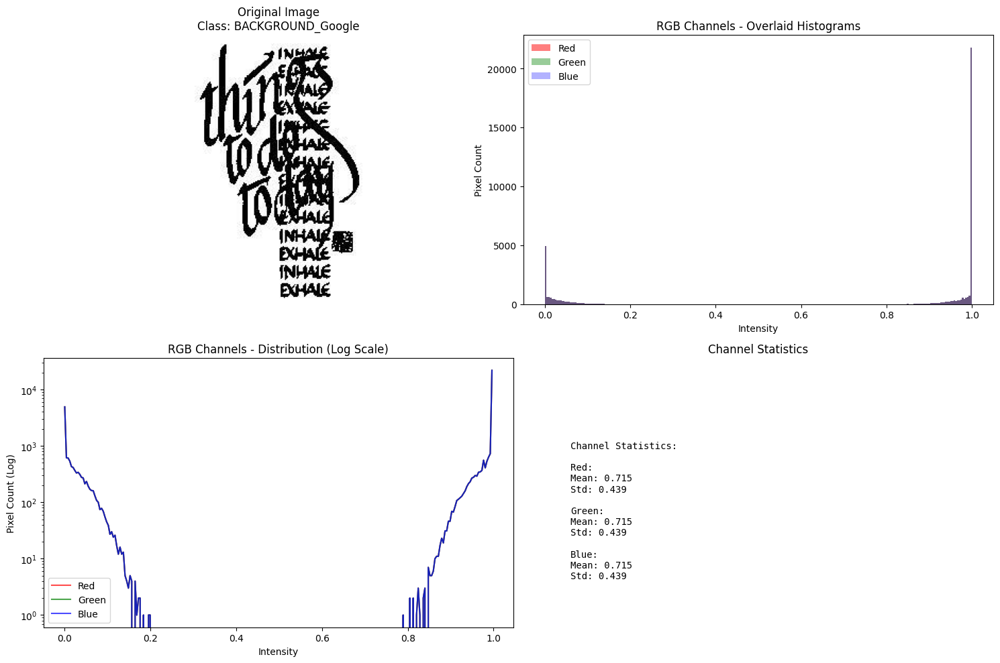


Image Analysis - BACKGROUND_Google
Shape: (254, 158, 3)
Intensity Range: 0.0 to 1.0


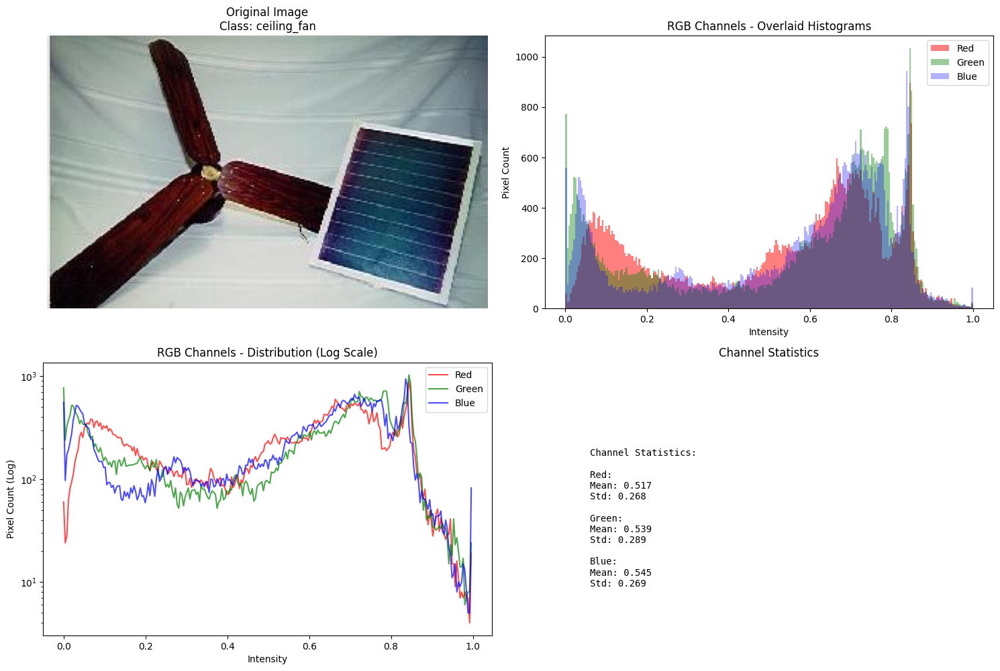


Image Analysis - ceiling_fan
Shape: (186, 300, 3)
Intensity Range: 0.0 to 1.0


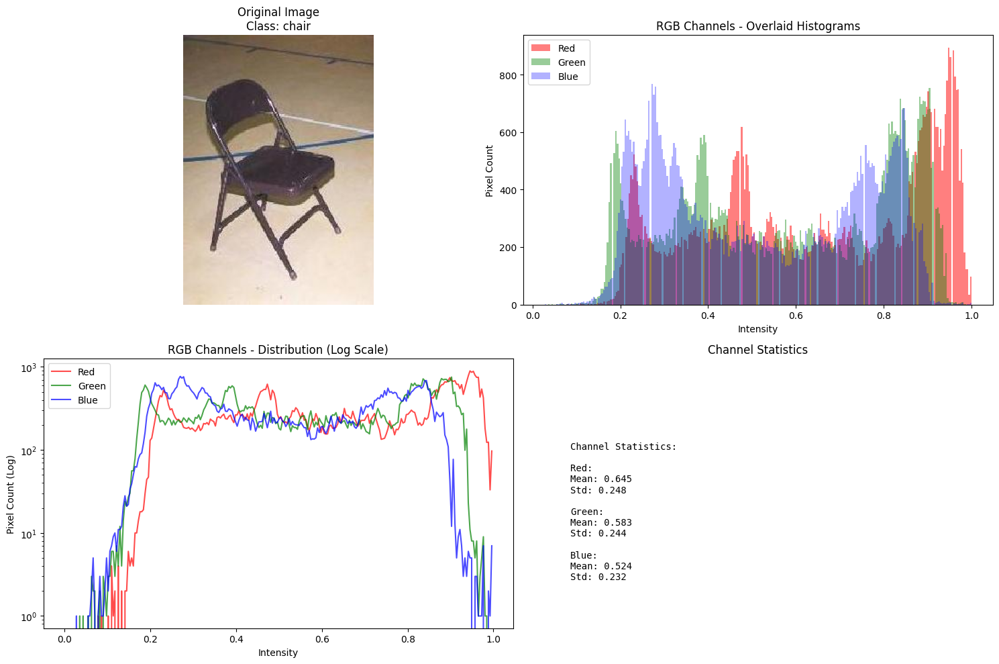


Image Analysis - chair
Shape: (300, 212, 3)
Intensity Range: 0.027450980392156862 to 1.0

Processing Image 1 from class: joshua_tree


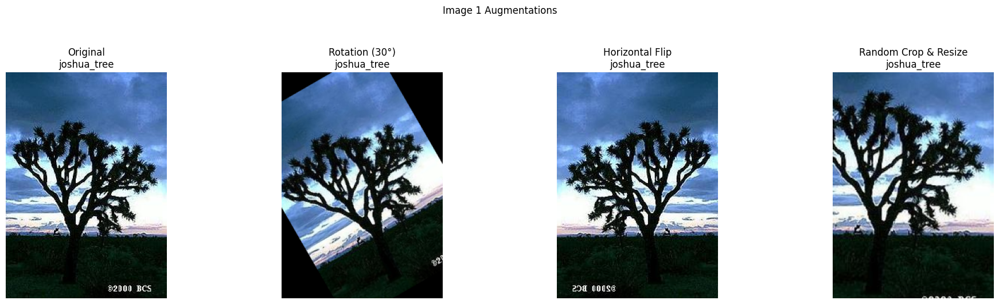


Augmentation Details for Image 1:
Class: joshua_tree
1. Rotation: 30 degrees clockwise
2. Horizontal Flip: Mirror image along vertical axis
3. Random Crop: 80% of original size, then resized back
Original Image Shape: (300, 214, 3)

Processing Image 2 from class: minaret


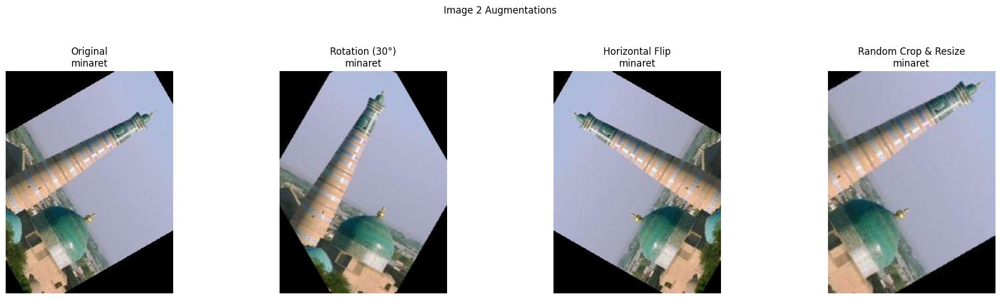


Augmentation Details for Image 2:
Class: minaret
1. Rotation: 30 degrees clockwise
2. Horizontal Flip: Mirror image along vertical axis
3. Random Crop: 80% of original size, then resized back
Original Image Shape: (300, 225, 3)

Processing Image 3 from class: airplanes


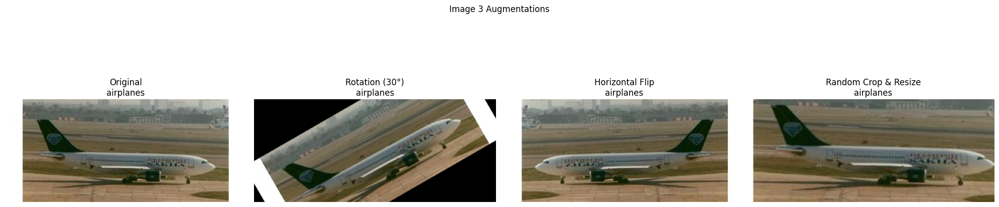


Augmentation Details for Image 3:
Class: airplanes
1. Rotation: 30 degrees clockwise
2. Horizontal Flip: Mirror image along vertical axis
3. Random Crop: 80% of original size, then resized back
Original Image Shape: (169, 397, 3)

Processing Image 4 from class: Leopards


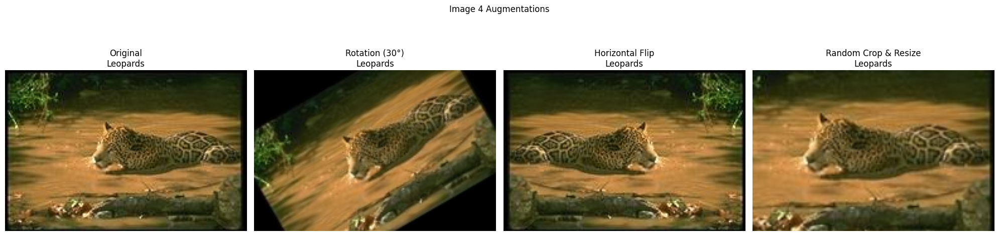


Augmentation Details for Image 4:
Class: Leopards
1. Rotation: 30 degrees clockwise
2. Horizontal Flip: Mirror image along vertical axis
3. Random Crop: 80% of original size, then resized back
Original Image Shape: (128, 192, 3)

Processing Image 5 from class: camera


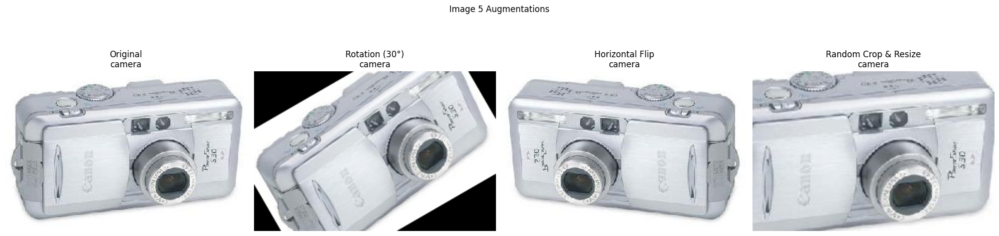


Augmentation Details for Image 5:
Class: camera
1. Rotation: 30 degrees clockwise
2. Horizontal Flip: Mirror image along vertical axis
3. Random Crop: 80% of original size, then resized back
Original Image Shape: (198, 300, 3)
Applying color augmentations to random images...


C:\Users\raksh\AppData\Roaming\Python\Python313\site-packages\pydantic\main.py:426: UserWarning: Pydantic serializer warnings:
  Expected `dict[str, any]` but got `UniformParams` with value `UniformParams(noise_type=...6, 0.0784313725490196)])` - serialized value may not be as expected
  return self.__pydantic_serializer__.to_python(


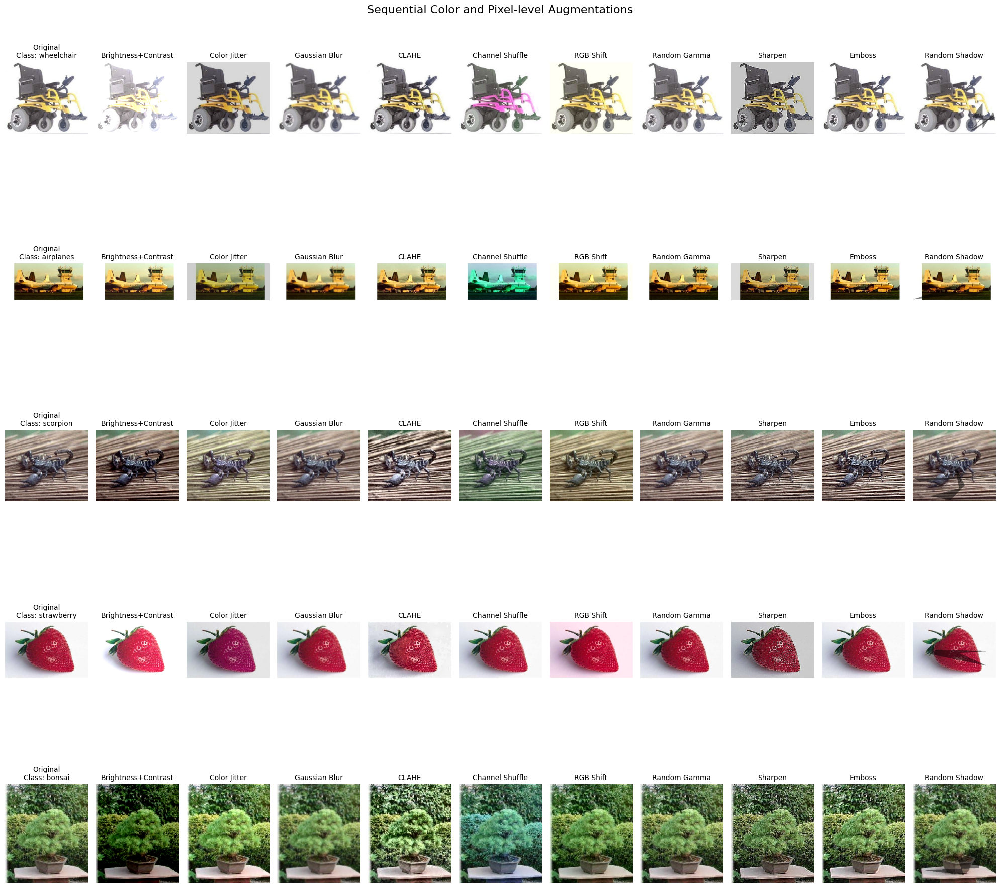

Color augmentations complete!


In [124]:
if __name__ == "__main__":
    
    random.seed(42)
    np.random.seed(42)
    
    """Part A: Splitting the Dataset and ploting """
    source_directory = "./caltech-101"
    output_directory = "./seg"
    train_directory = "./seg/train"
    create_split_datasets(source_directory, output_directory)
    plot_random_images(source_directory)
    
    """Part B: Class Distribution"""
    dataset_path = "./seg/train"
    class_dist = analyze_class_distribution(dataset_path)
    plot_class_distribution(class_dist)
    solutions = write_imbalance_solutions()
    print(solutions)
    
    """Part C: RGB Channel """
    analyze_random_train_images(train_directory)
    
    """Part D: Geometric Augmentation"""
    apply_sequential_augmentations(train_directory)
    
    """Part E: Image Augmentation"""
    try:
        print("Applying color augmentations to random images...")
        apply_sequential_color_augmentations(train_directory)
        print("Color augmentations complete!")
        
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        raise

